<a href="https://colab.research.google.com/github/kdChen07/LSCP_kd/blob/main/map%26gini_index.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [80]:
!pip install inequality
!pip install libpysal
!pip install geopandas
!pip install mapclassify

In [81]:
import mapclassify
from google.colab import files 
import pandas
import numpy

In [82]:
import sys
import os
import matplotlib.pyplot as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [83]:
sys.path.append(os.path.abspath('..'))
import inequality
import libpysal

##第一部分

#读取MSOA数据

In [85]:
import geopandas

gdf = geopandas.read_file('https://github.com/LingruFeng/dissertation/blob/main/data_github/England_basemap/MSOA_Boundary_with_population.gpkg?raw=true')
gdf = gdf.to_crs('epsg:4326')
from libpysal.weights import Queen, Rook, KNN

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
tract = geopandas.read_file('https://github.com/LingruFeng/dissertation/blob/main/data_github/England_basemap/MSOA_Boundary_with_population.gpkg?raw=true')
tract = tract.to_crs('epsg:4326')

In [ ]:
gdf['dissolve']=1
MSOA_outline = gdf.dissolve(by='dissolve')

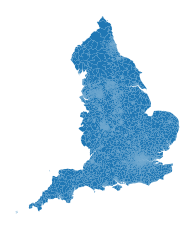

In [ ]:
ax = gdf.plot()
ax.set_axis_off()

#读入能为MSOA提供疫苗服务的原有疫苗站数量

In [ ]:
a=pandas.read_csv('6400&1600.csv')
a.head()

,origin_id,number
0,E02000001,623
1,E02000002,69
2,E02000003,68
3,E02000004,42
4,E02000005,73


#将地图数据和能提供疫苗站数量拼接

In [ ]:
gdf1 = pandas.merge(left = gdf,right = a, how='right', left_on='MSOA11CD', right_on='origin_id')

In [86]:
gdf1.head()

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,dissolve,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",1,E02000001,623
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",1,E02000002,69
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",1,E02000003,68
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",1,E02000004,42
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",1,E02000005,73


In [ ]:
fig, ax = plt.subplots(figsize=(18,18),dpi=300)
gdf1.plot(ax=ax,column='number',k=5,scheme='Quantiles',legend=True)
MSOA_outline.plot(edgecolor='k', facecolor='none', linewidth=1,ax=ax)
ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
head_width=.2, head_length=.4, overhang=.1, facecolor='k')
plt.gca().set_aspect('auto')

#基尼系数

In [ ]:
gini_1600 = inequality.gini.Gini(gdf1['number'])

In [ ]:
gini_1600.g

In [87]:
tract1=pandas.merge(left = gdf,right = a, how='right', left_on='MSOA11CD', right_on='origin_id')

In [88]:
tract11 =tract1.loc[tract1['number']==0]
tract12 =tract1.loc[tract1['number']==1]
tract13 =tract1.loc[tract1['number']==2]
tract14 =tract1.loc[(tract1['number']>=3)&(tract1['number']<7)]
tract15 =tract1.loc[(tract1['number']>=7)&(tract1['number']<19)]
tract16 =tract1.loc[(tract1['number']>=19)&(tract1['number']<660)]

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


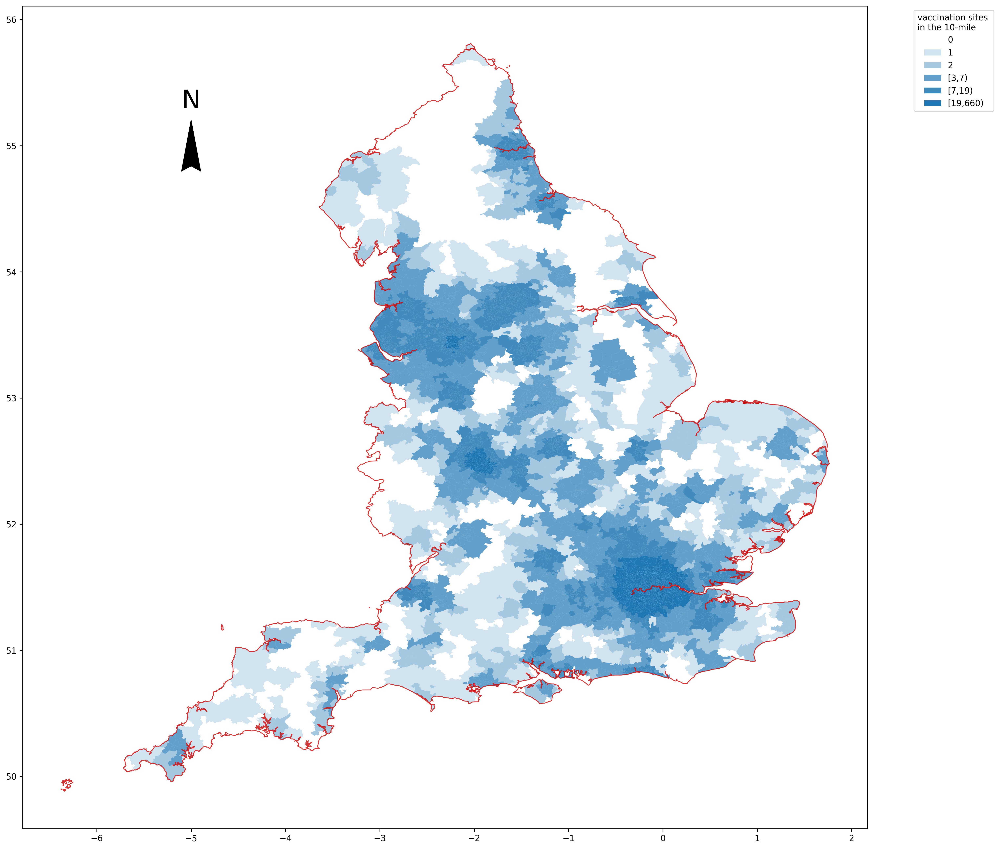

In [89]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=300)
    legend_elements = []
    tract11.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract12.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract13.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract14.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract15.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract16.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract17.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract18.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8), label='MSOAs with Vaccination Service'))
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),facecolor='none',label='MSOAs Lack of Vaccination Service'))
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    
    plt.gca().set_aspect('auto')
    # plt.title('title', fontweight="bold")
    plt.legend(handles = legend_elements, loc='upper left',title='vaccination sites \nin the 10-mile',bbox_to_anchor=(1.05, 1))

##第二部分

#读入LSCP2优化后的能为MSOA提供疫苗服务的疫苗站数量

In [ ]:
b=pandas.read_csv('6400&300.csv')
b

,origin_id,number
0,E02000001,2
1,E02000002,1
2,E02000003,1
3,E02000004,1
4,E02000005,1
...,...,...
6403,E02006930,1
6404,E02006931,1
6405,E02006932,2
6406,E02006933,2


In [ ]:
gdf2 = pandas.merge(left = gdf,right = b, how='right', left_on='MSOA11CD', right_on='origin_id')

/usr/local/lib/python3.7/dist-packages/mapclassify/classifiers.py:239: UserWarning: Warning: Not enough unique values in array to form k classes
  "Warning: Not enough unique values in array to form k classes", UserWarning
/usr/local/lib/python3.7/dist-packages/mapclassify/classifiers.py:241: UserWarning: Warning: setting k to 3
  Warn("Warning: setting k to %d" % k_q, UserWarning)


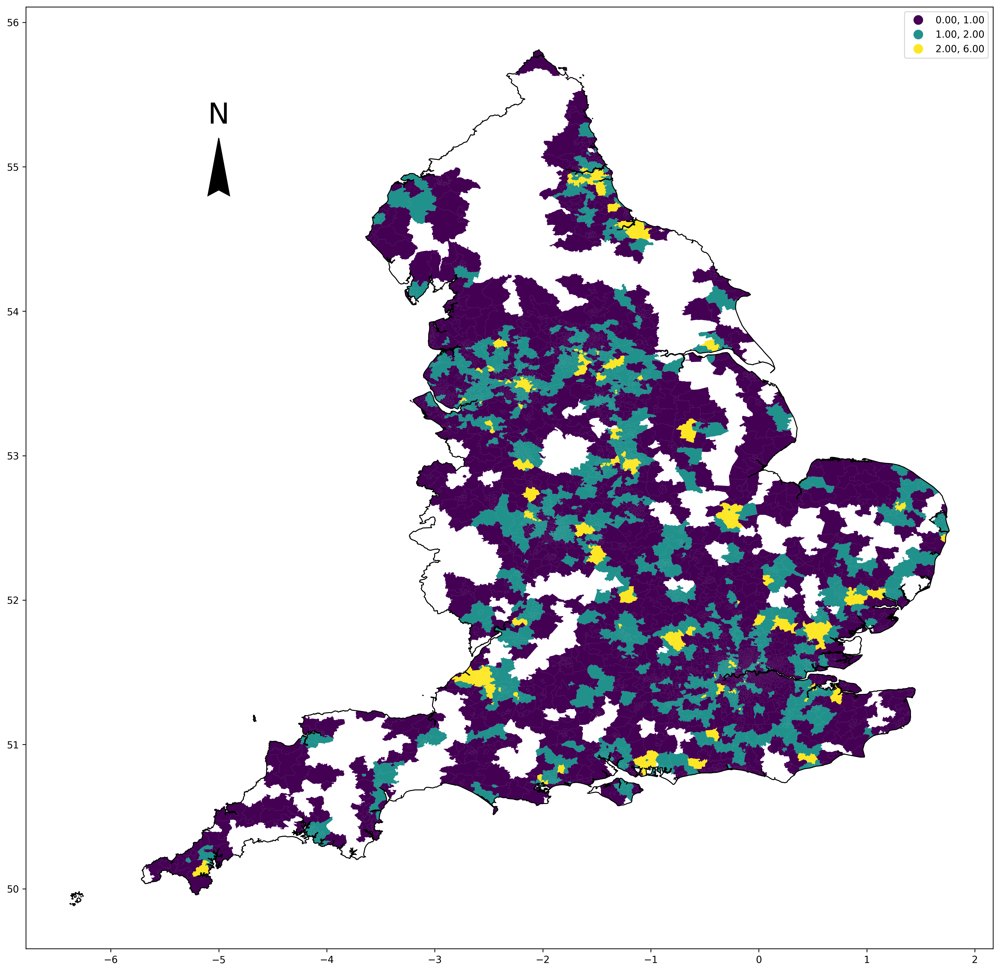

In [ ]:
fig, ax = plt.subplots(figsize=(18,18),dpi=300)
gdf2.plot(ax=ax,column='number',k=5,scheme='Quantiles',legend=True)
MSOA_outline.plot(edgecolor='k', facecolor='none', linewidth=1,ax=ax)
ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
head_width=.2, head_length=.4, overhang=.1, facecolor='k')
plt.gca().set_aspect('auto')

#基尼系数

In [ ]:
gini_300 = inequality.gini.Gini(gdf2['number'])

In [ ]:
gini_300.g

0.21678478006433888

In [90]:
tract2=pandas.merge(left = gdf,right = b, how='right', left_on='MSOA11CD', right_on='origin_id')

In [92]:
tract21 =tract2.loc[tract2['number']==0]
tract22 =tract2.loc[tract2['number']==1]
tract23 =tract2.loc[tract2['number']==2]
tract24 =tract2.loc[(tract2['number']>=3)&(tract2['number']<7)]
tract25 =tract2.loc[(tract2['number']>=7)&(tract2['number']<19)]
tract26 =tract2.loc[(tract2['number']>=19)&(tract2['number']<660)]

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


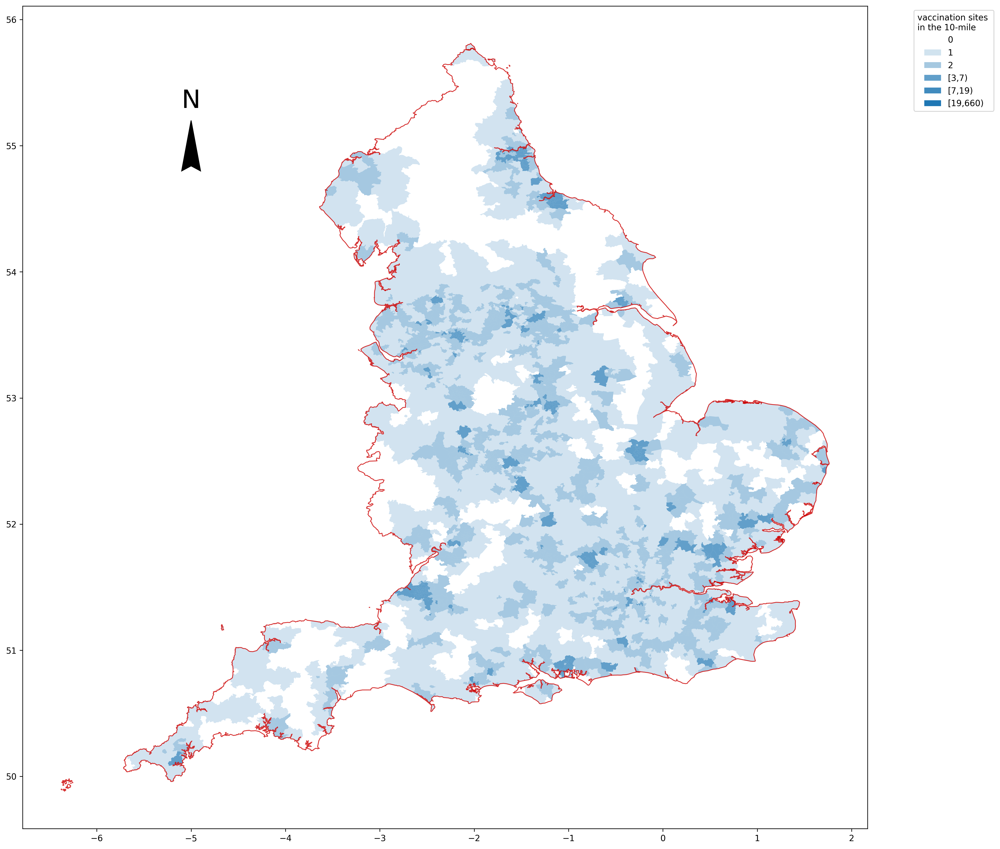

In [95]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=300)
    legend_elements = []
    tract21.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract22.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract23.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract24.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract25.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract26.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract17.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract18.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8), label='MSOAs with Vaccination Service'))
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),facecolor='none',label='MSOAs Lack of Vaccination Service'))
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    
    plt.gca().set_aspect('auto')
    # plt.title('title', fontweight="bold")
    plt.legend(handles = legend_elements, loc='upper left',title='vaccination sites \nin the 10-mile',bbox_to_anchor=(1.05, 1))

##第三部分

In [ ]:
gdf3 = pandas.merge(left = gdf,right = a, how='left', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
gdf3

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",E02000001,623.0
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",E02000002,69.0
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",E02000003,68.0
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",E02000004,42.0
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",E02000005,73.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6786,E02006930,Greenwich 037,7425,741,473,305,167,16,9127,"POLYGON ((0.02331 51.48469, 0.02018 51.48441, ...",E02006930,453.0
6787,E02006931,Greenwich 038,7267,1024,672,510,255,78,9806,"POLYGON ((-0.00284 51.48251, 0.00141 51.48214,...",E02006931,516.0
6788,E02006932,Liverpool 060,16963,264,173,80,25,10,17515,"POLYGON ((-2.96793 53.41177, -2.96814 53.40874...",E02006932,14.0
6789,E02006933,Liverpool 061,7130,603,485,220,97,4,8539,"POLYGON ((-2.97760 53.39957, -2.98328 53.39717...",E02006933,13.0


#将空白区域number值填充为0，意为无疫苗服务

In [ ]:
gdf3['number'].fillna(0, inplace=True)

In [ ]:
fig, ax = plt.subplots(figsize=(18,18),dpi=300)
gdf3.plot(ax=ax,column='number',k=5,scheme='Quantiles',legend=True)
MSOA_outline.plot(edgecolor='k', facecolor='none', linewidth=1,ax=ax)
ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
head_width=.2, head_length=.4, overhang=.1, facecolor='k')
plt.gca().set_aspect('auto')

#基尼系数

In [ ]:
gini_1600Z = inequality.gini.Gini(gdf3['number'])
gini_1600Z.g

0.8371008749630625

##第四种情况

#读入能为6788个（有3个MSOA无法得到服务）MSOA提供疫苗服务的经过LSCP1、LSCP2优化后的疫苗站数量number

In [ ]:
c=pandas.read_csv('383&27000.csv')
c

,origin_id,number
0,E02002527,1
1,E02002692,1
2,E02002693,1
3,E02002694,2
4,E02002695,1
...,...,...
6783,E02006930,1
6784,E02006931,1
6785,E02006932,2
6786,E02006933,2


In [ ]:
gdf5 = pandas.merge(left = gdf,right = c, how='left', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
gdf5['number'].fillna(0, inplace=True)
gdf5

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,dissolve,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",1,E02000001,2.0
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",1,E02000002,1.0
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",1,E02000003,1.0
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",1,E02000004,1.0
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",1,E02000005,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6786,E02006930,Greenwich 037,7425,741,473,305,167,16,9127,"POLYGON ((0.02331 51.48469, 0.02018 51.48441, ...",1,E02006930,1.0
6787,E02006931,Greenwich 038,7267,1024,672,510,255,78,9806,"POLYGON ((-0.00284 51.48251, 0.00141 51.48214,...",1,E02006931,1.0
6788,E02006932,Liverpool 060,16963,264,173,80,25,10,17515,"POLYGON ((-2.96793 53.41177, -2.96814 53.40874...",1,E02006932,2.0
6789,E02006933,Liverpool 061,7130,603,485,220,97,4,8539,"POLYGON ((-2.97760 53.39957, -2.98328 53.39717...",1,E02006933,2.0


In [ ]:
fig, ax = plt.subplots(figsize=(18,18),dpi=300)
gdf5.plot(ax=ax,column='number',k=5,scheme='Quantiles',legend=True)
MSOA_outline.plot(edgecolor='k', facecolor='none', linewidth=1,ax=ax)
ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
head_width=.2, head_length=.4, overhang=.1, facecolor='k')
plt.gca().set_aspect('auto')

#基尼系数

In [ ]:
gini_1600Z2 = inequality.gini.Gini(gdf5['number'])
gini_1600Z2.g

0.21626175456189098

In [96]:
tract3=pandas.merge(left = gdf,right = c, how='left', left_on='MSOA11CD', right_on='origin_id')

In [97]:
tract3['number'].fillna(0, inplace=True)
tract3

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",E02000001,2.0
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",E02000002,1.0
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",E02000003,1.0
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",E02000004,1.0
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",E02000005,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6786,E02006930,Greenwich 037,7425,741,473,305,167,16,9127,"POLYGON ((0.02331 51.48469, 0.02018 51.48441, ...",E02006930,1.0
6787,E02006931,Greenwich 038,7267,1024,672,510,255,78,9806,"POLYGON ((-0.00284 51.48251, 0.00141 51.48214,...",E02006931,1.0
6788,E02006932,Liverpool 060,16963,264,173,80,25,10,17515,"POLYGON ((-2.96793 53.41177, -2.96814 53.40874...",E02006932,2.0
6789,E02006933,Liverpool 061,7130,603,485,220,97,4,8539,"POLYGON ((-2.97760 53.39957, -2.98328 53.39717...",E02006933,2.0


In [98]:
tract31 =tract3.loc[tract3['number']==0]
tract32 =tract3.loc[tract3['number']==1]
tract33 =tract3.loc[tract3['number']==2]
tract34 =tract3.loc[(tract3['number']>=3)&(tract3['number']<7)]
tract35 =tract3.loc[(tract3['number']>=7)&(tract3['number']<19)]
tract36 =tract3.loc[(tract3['number']>=19)&(tract3['number']<660)]

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:681: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


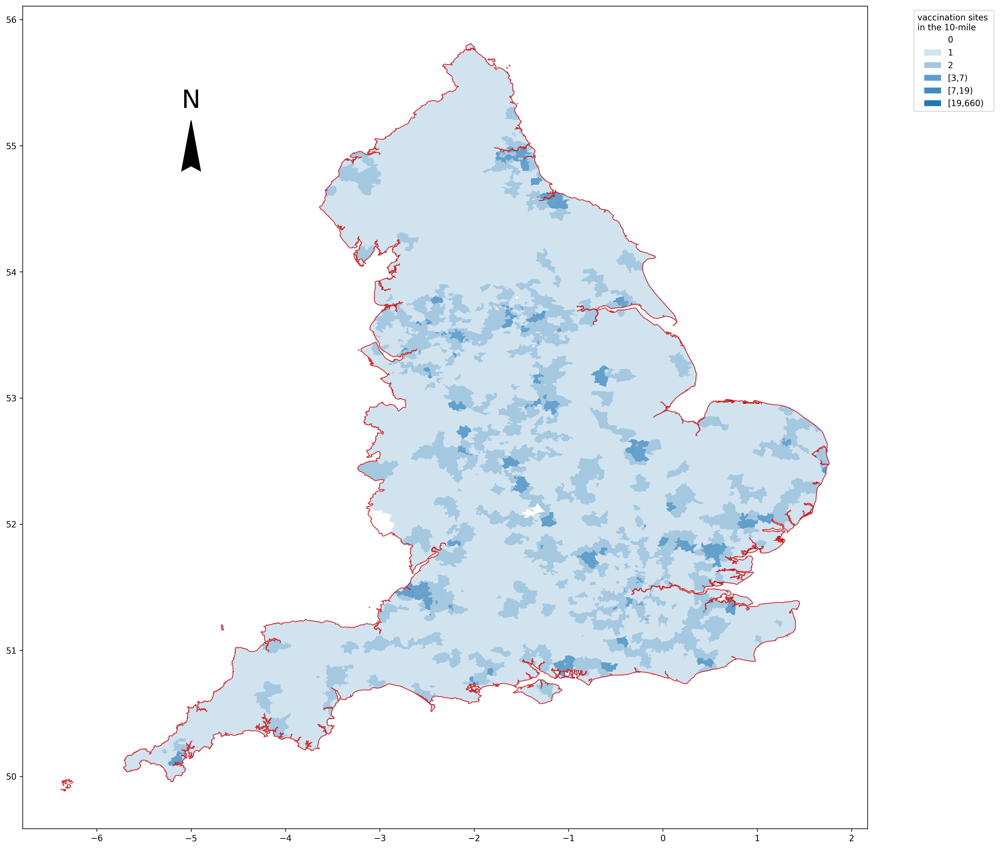

In [99]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=300)
    legend_elements = []
    tract31.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract32.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract33.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract34.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract35.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract36.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract17.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract18.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8), label='MSOAs with Vaccination Service'))
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),facecolor='none',label='MSOAs Lack of Vaccination Service'))
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    
    plt.gca().set_aspect('auto')
    # plt.title('title', fontweight="bold")
    plt.legend(handles = legend_elements, loc='upper left',title='vaccination sites \nin the 10-mile',bbox_to_anchor=(1.05, 1))